In [1]:
#!/usr/bin/env python
# coding: utf-8

# # Creating an optimisation with meta parameters
# 
# This notebook will explain how to set up an optimisation that uses metaparameters (parameters that control other parameters)


import bluepyopt as bpop
import bluepyopt.ephys as ephys
import pickle
from sciunit.scores import ZScore
from sciunit import TestSuite
from sciunit.scores.collections import ScoreArray
import sciunit
import numpy as np
from neuronunit.optimisation.optimization_management import dtc_to_rheo, switch_logic,active_values
from neuronunit.tests.base import AMPL, DELAY, DURATION

import quantities as pq
PASSIVE_DURATION = 500.0*pq.ms
PASSIVE_DELAY = 200.0*pq.ms
import matplotlib.pyplot as plt
from bluepyopt.ephys.models import ReducedCellModel
import numpy
from neuronunit.optimisation.optimization_management import test_all_objective_test
from neuronunit.optimisation.optimization_management import check_binary_match, three_step_protocol,inject_and_plot_passive_model
from neuronunit.optimisation.model_parameters import MODEL_PARAMS

MODEL_PARAMS["IZHI"].pop('C',None)
MODEL_PARAMS["IZHI"].pop('k',None)
MODEL_PARAMS["IZHI"].pop('vPeak',None)
MODEL_PARAMS["IZHI"].pop('vt',None)
#MODEL_PARAMS["IZHI"].pop('c',None)
MODEL_PARAMS["IZHI"].pop('vr',None)


import numpy as np


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# First we need to import the module that contains all the functionality to create electrical cell models

# If you want to see a lot of information about the internals, 
# the verbose level can be set to 'debug' by commenting out
# the following lines

# Setting up the cell
# ---------------------
# This is very similar to the simplecell example in the directory above. For a more detailed explanation, look there.

# For this example we will create two separate parameters to store the specific capacitance. One for the soma and one for the soma. We will put a metaparameter on top of these two to keep the value between soma and axon the same.

# The metaparameter, the one that will be optimised, will make sure the two parameters above keep always the same value

# And parameters that represent the maximal conductance of the sodium and potassium channels. These two parameters will be not be optimised but are frozen.

# ### Creating the template
# 
# To create the cell template, we pass all these objects to the constructor of the template.
# We *only* put the metaparameter, not its subparameters.


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# Now we can print out a description of the cell

model = simple_cell
model.params = {k:np.mean(v) for k,v in model.params.items() }


# With this cell we can build a cell evaluator.

# ## Setting up a cell evaluator
# 
# To optimise the parameters of the cell we need to create cell evaluator object. 
# This object will need to know which protocols to inject, which parameters to optimise, etc.

# ### Creating the protocols
# 
# 

#twostep_protocol


# ### Running a protocol on a cell
# 
# Now we're at a stage where we can actually run a protocol on the cell. We first need to create a Simulator object.



# The run() method of a protocol accepts a cell model, a set of parameter values and a simulator

# Plotting the response traces is now easy:

# ### Defining eFeatures and objectives
# 
# For every response we need to define a set of eFeatures we will use for the fitness calculation later. We have to combine features together into objectives that will be used by the optimalisation algorithm. In this case we will create one objective per feature:

from sciunit.scores import ZScore
tests = pickle.load(open("processed_multicellular_constraints.p","rb"))
nu_tests = tests['Hippocampus CA1 pyramidal cell'].tests
nu_tests[0].score_type = ZScore

nu_tests, OM, target = test_all_objective_test(MODEL_PARAMS["IZHI"],model_type="IZHI",protocol={'allen':False,'elephant':True})




nu_tests = list(nu_tests.values())
nu_tests[0].score_type = ZScore
target = three_step_protocol(target)
target.rheobase
target.everything






def initialise_test(v,rheobase):
    v = switch_logic([v])
    v = v[0]
    k = v.name
    if not hasattr(v,'params'):
        v.params = {}
    if not 'injected_square_current' in v.params.keys():    
        v.params['injected_square_current'] = {}
    if v.passive == False and v.active == True:
        keyed = v.params['injected_square_current']
        v.params = active_values(keyed,rheobase)
        v.params['injected_square_current']['delay'] = DELAY
        v.params['injected_square_current']['duration'] = DURATION
    if v.passive == True and v.active == False:

        v.params['injected_square_current']['amplitude'] =  -10*pq.pA
        v.params['injected_square_current']['delay'] = PASSIVE_DELAY
        v.params['injected_square_current']['duration'] = PASSIVE_DURATION

    if v.name in str('RestingPotentialTest'):
        v.params['injected_square_current']['delay'] = PASSIVE_DELAY
        v.params['injected_square_current']['duration'] = PASSIVE_DURATION
        v.params['injected_square_current']['amplitude'] = 0.0*pq.pA    
        
    return v

class NUFeature(object):
    def __init__(self,test,model):
        self.test = test
        self.model = model
    def calculate_score(self,responses):
        model = responses['model'].dtc_to_model()
        model.attrs = responses['params']
        
        ##
        # Last 4 lines entered
        ##
        if responses['rheobase'] is None:
            return 100.0
        if type(responses['rheobase']) is type(dict()):
            if responses['rheobase']['value'] is None:
                return 100.0
        self.test = initialise_test(self.test,responses['rheobase'])
        #if "RestingPotential" in str(self.test.name):            
        #    print(self.test.observation,self.test.prediction)
        if "Rheobase" in str(self.test.name):
            prediction = {'value':responses['rheobase']}

            score_gene = self.test.compute_score(self.test.observation,prediction)
            try:

                lns = np.abs(score_gene.log_norm_score)
            except:
                # works 1/2 time that log_norm_score does not work
                # more informative than nominal bad score 100
                #lns = float(score_gene.raw)

                lns = np.abs(float(score_gene.raw))
            return lns

        else:
            try:
                score_gene = self.test.judge(model)
            except:
                return 100.0

        if not isinstance(type(score_gene),type(None)):
            if not isinstance(score_gene,sciunit.scores.InsufficientDataScore):
                if not isinstance(type(score_gene.log_norm_score),type(None)):
                    try:

                        lns = np.abs(score_gene.log_norm_score)
                    except:
                        # works 1/2 time that log_norm_score does not work
                        # more informative than nominal bad score 100
                        s
                else:
                    # works 1/2 time that log_norm_score does not work
                    # more informative than nominal bad score 100

                    lns = np.abs(score_gene.raw)
            else:
                prediction = self.test.generate_prediction(model)
                lns = 100
        if lns==np.inf:
            

            lns = float(score_gene.raw)
        #if lns == 100:
        #    print(self.test.name,score_gene)
        return lns

    
objectives = []
#for protocol in sweep_protocols:
#    stim_start = protocol.stimuli[0].step_delay
#    stim_end = stim_start + protocol.stimuli[0].step_duration
    
for tt in nu_tests:
    feature_name = '%s.%s' % (tt.name, tt.name)
    ft = NUFeature(tt,model)
    objective = ephys.objectives.SingletonObjective(
        feature_name,
        ft)
    objectives.append(objective)

score_calc = ephys.objectivescalculators.ObjectivesCalculator(objectives) 
        
        
#objectives[0]        



# ### Creating the cell evaluator
# 
# We will need an object that can use these objective definitions to calculate the scores from a protocol response. This is called a ScoreCalculator.




lop={}
from bluepyopt.parameters import Parameter
for k,v in MODEL_PARAMS["IZHI"].items():
    p = Parameter(name=k,bounds=v,frozen=False)
    lop[k] = p

print(lop)
simple_cell.params = lop

nu_tests[0].judge(simple_cell)

nu_tests[0].score_type = ZScore


# Combining everything together we have a CellEvaluator. The CellEvaluator constructor has a field 'parameter_names' which contains the (ordered) list of names of the parameters that are used as input (and will be fitted later on).
sweep_protocols = []
for protocol_name, amplitude in [('step1', 0.05)]:

    protocol = ephys.protocols.SweepProtocol(protocol_name, [None], [None])
    sweep_protocols.append(protocol)
twostep_protocol = ephys.protocols.SequenceProtocol('twostep', protocols=sweep_protocols)

MODEL_PARAMS["IZHI"]
cell_evaluator = ephys.evaluators.CellEvaluator(
        cell_model=simple_cell,
        param_names=MODEL_PARAMS["IZHI"].keys(),
        fitness_protocols={twostep_protocol.name: twostep_protocol},
        fitness_calculator=score_calc,
        sim='euler')
simple_cell.params_by_names(MODEL_PARAMS["IZHI"].keys())
simple_cell.params;


# ### Evaluating the cell
# 
# The cell can now be evaluate for a certain set of parameter values.

# In[ ]:


#default_params = MODEL_PARAMS["IZHI"]
#print(cell_evaluator.evaluate_with_dicts())


# ## Setting up and running an optimisation
# 
# Now that we have a cell template and an evaluator for this cell, we can set up an optimisation.
import dask
def dask_map_function(eval_,invalid_ind):
    results = []
    for x in invalid_ind:
        y = dask.delayed(eval_)(x)
        results.append(y)
    fitnesses = dask.compute(*results)
    return fitnesses



MU =20
optimisation = bpop.optimisations.DEAPOptimisation(
        evaluator=cell_evaluator,
        offspring_size = MU,
        map_function = dask_map_function,
        selector_name='NSGA2',
        mutpb=0.9,
        cxpb=0.9)


# And this optimisation can be run for a certain number of generations



final_pop, hall_of_fame, logs, hist = optimisation.run(max_ngen=25)




/home/user/anaconda3/lib/python3.7/site-packages/airspeed/__init__.py:505: FutureWarning: Possible nested set at position 8
  KEYVALSEP = re.compile(r'[ \t]*:[[ \t]*(.*)$', re.S)


Random simulated data tests made
{'value': array(117.7734375) * pA}
{'value': array(3196.67953925) * ms}
{'mean': array(-65.22618636) * mV, 'std': array(1.42108547e-14) * mV}
{'value': array(29377909.3140003) * kg*m**2/(s**3*A**2)}
{'value': array(1.08812356e-07) * s**4*A**2/(kg*m**2)}
{'mean': array(0.00037) * s, 'std': array(0.) * s, 'n': 1}
{'value': array(52.55347242) * mV, 'mean': array(52.55347242) * mV, 'std': array(0.) * mV, 'n': 1}
{'mean': array(-31.41513348) * mV, 'std': array(0.) * mV, 'n': 1}


INFO:numexpr.utils:NumExpr defaulting to 4 threads.


{'a': <bluepyopt.parameters.Parameter object at 0x7efc639cf1d0>, 'b': <bluepyopt.parameters.Parameter object at 0x7efc63854910>, 'c': <bluepyopt.parameters.Parameter object at 0x7efc638548d0>, 'd': <bluepyopt.parameters.Parameter object at 0x7efc63854c50>}


INFO:__main__:gen	nevals	avg    	std    	min     	max    
1  	20    	9.44696	13.7003	0.458731	37.3289
2  	20    	8.75341	13.02  	0.200865	37.3289
INFO:__main__:3  	20    	12.1167	15.1418	0.200865	37.4103
INFO:__main__:4  	20    	11.266 	15.6668	0.200865	37.7109
INFO:__main__:5  	20    	14.217 	20.7282	0.162118	100.84 
INFO:__main__:6  	20    	8.15627	18.4745	0.0683353	100.84 
INFO:__main__:7  	20    	5.79871	11.0464	0.0683353	37.3289
INFO:__main__:8  	19    	4.86763	7.9408 	0.0683353	34.973 
INFO:__main__:9  	20    	4.48967	6.65618	0.0683353	35.8247
INFO:__main__:10 	20    	5.77827	8.02344	0.0683353	35.3606
INFO:__main__:11 	20    	3.81712	4.46902	0.0683353	9.6888 
INFO:__main__:12 	20    	5.17762	8.30086	0.0683353	37.2666
INFO:__main__:13 	20    	5.7527 	10.8291	0.0683353	37.2901
INFO:__main__:14 	20    	3.97412	6.66455	0.0683353	35.9429
INFO:__main__:15 	20    	3.44479	6.36562	0.0535804	34.2032
INFO:__main__:16 	19    	3.28517	4.39999	0.0535804	9.6888 
INFO:__main__:17 	20    	7.5590

Final population:  [[0.020901592120559136, 14.723080788871389, -45.050237443543956, 47.06342455333695], [0.020901592120559136, 14.723080788871389, -45.050237443543956, 47.06342455333695], [0.01020181012520675, 9.226118144942843, -51.643763558922984, 87.4686260258333], [0.01020181012520675, 9.226118144942843, -51.643763558922984, 87.4686260258333], [0.010990794274823214, 8.06544588944731, -59.004106134151776, 69.58684981330083], [0.020860450682503962, 14.731061924984882, -40.282462576077556, 68.21227469988088], [0.01440427056436978, 10.491341103922775, -59.42643679208643, 63.20080541220493], [0.01028443128923525, 7.698537748531401, -51.35647223384655, 20.32118875977111], [0.016232454478191348, 11.443034620168095, -42.46947814497475, 63.56597364039321], [0.020153320324988847, 14.107203727099053, -40.282462576077556, 79.78623562108653], [0.01992261958286411, 14.040638892758702, -41.99864042933648, 56.39973980087952], [0.0161963011863055, 11.443034620168095, -42.46947814497475, 71.10375585

[-65.22618636] mV [-65.22618636] mV


(0.04481886166440537, 0.5046043832019144)

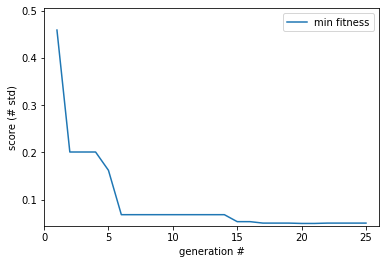

In [2]:


# The optimisation has return us 4 objects: final population, hall of fame, statistical logs and history. 
# 
# The final population contains a list of tuples, with each tuple representing the two parameters of the model


print('Final population: ', final_pop)


# The best individual found during the optimisation is the first individual of the hall of fame

best_ind = hall_of_fame[0]
print('Best individual: ', best_ind)
print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
cell_evaluator.param_dict(best_ind)
model.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}



opt = model.model_to_dtc()
opt.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}

check_binary_match(target,opt)
inject_and_plot_passive_model(opt,second=target)


# As you can see the evaluation returns the same values as the fitness values provided by the optimisation output. 
# We can have a look at the responses now.

# In[ ]:


#plot_responses(twostep_protocol.run(cell_model=simple_cell, param_values=best_ind_dict, sim=nrn))
 


# Let's have a look at the optimisation statistics.
# We can plot the minimal score (sum of all objective scores) found in every optimisation. 
# The optimisation algorithm uses negative fitness scores, so we actually have to look at the maximum values log.

gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
plt.plot(gen_numbers, min_fitness, label='min fitness')
plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 


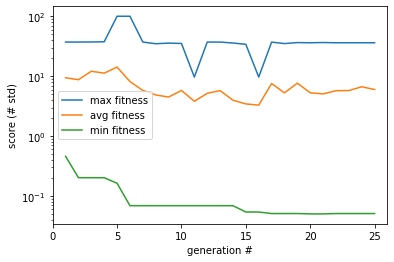

In [3]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
plt.plot(gen_numbers, max_fitness, label='max fitness')
plt.plot(gen_numbers, avg_fitness, label='avg fitness')
plt.plot(gen_numbers, min_fitness, label='min fitness')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.yscale('log')

plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()


<Figure size 432x288 with 0 Axes>

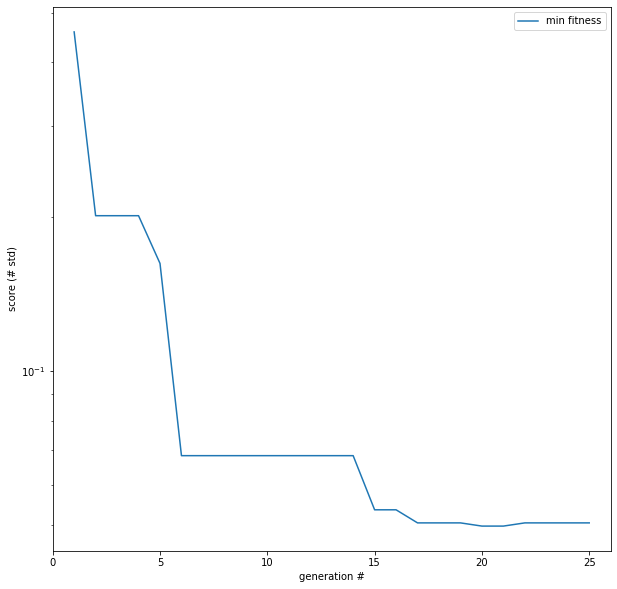

In [4]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
fig = plt.figure(figsize=(10,10))
#ax = fig.add_subplot(1,1)

plt.plot(gen_numbers, min_fitness, label='min fitness')
#ax.semilogy()
#ax.set_yscale('log')
plt.yscale('log')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()

[-65.22618636] mV [-65.22618636] mV


(AnalogSignal with 1 channels of length 80000; units mV; datatype float64 
 sampling rate: 100.0 1/ms
 time: 0.0 s to 0.8 s,
 <module 'matplotlib.pyplot' from '/home/user/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>)

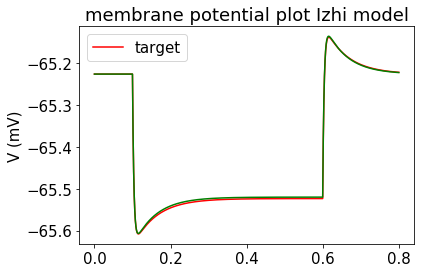

In [5]:
inject_and_plot_passive_model(opt,second=target,plotly=False)


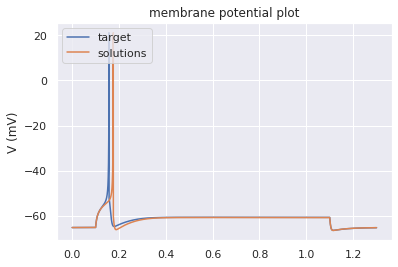

<Figure size 432x288 with 0 Axes>

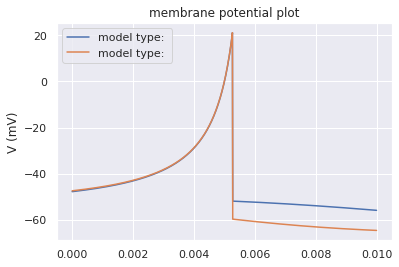

In [33]:
check_binary_match(opt,target,plotly=False,snippets=False)
check_binary_match(opt,target,plotly=False,snippets=True)


In [6]:
best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

In [7]:
objectives

{'RheobaseTest.RheobaseTest': 0.024463703304026717,
 'TimeConstantTest.TimeConstantTest': 0.005493715302574681,
 'RestingPotentialTest.RestingPotentialTest': 0.0,
 'InputResistanceTest.InputResistanceTest': 0.0035624501498480446,
 'CapacitanceTest.CapacitanceTest': 0.0007712605588383542,
 'InjectedCurrentAPWidthTest.InjectedCurrentAPWidthTest': 0.01084044147806427,
 'InjectedCurrentAPAmplitudeTest.InjectedCurrentAPAmplitudeTest': 0.0017454830914087685,
 'InjectedCurrentAPThresholdTest.InjectedCurrentAPThresholdTest': 0.0029216812979118104}

In [8]:
opt = dtc_to_rheo(opt)
print(opt.rheobase)


117.7734375 pA


In [9]:
target.rheobase

array(117.7734375) * pA

In [10]:
params = {}
params['injected_square_current'] = {}
#if v.name in str('RestingPotentialTest'):
params['injected_square_current']['delay'] = PASSIVE_DELAY
params['injected_square_current']['duration'] = PASSIVE_DURATION
params['injected_square_current']['amplitude'] = 0.0*pq.pA    

In [11]:

opt_model = opt.dtc_to_model()
opt_model.inject_square_current(params)
opt_vm = opt_model.get_membrane_potential()
opt_vm[-1]

array([-65.22618636]) * mV

In [12]:
target_model = target.dtc_to_model()
target_model.inject_square_current(params)
target_vm = target_model.get_membrane_potential()
target_vm[-1]

array([-65.22618636]) * mV

In [13]:
best_ind = hall_of_fame[1]
print('Best individual: ', best_ind)
print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
dtc= model.model_to_dtc()
opt = dtc_to_rheo(opt)
print(opt.rheobase)


Best individual:  [0.01440427056436978, 10.491341103922775, -59.42643679208643, 48.40858070293786]
Fitness values:  (0.024463703304026717, 0.010591339941606617, 0.0, 0.010891208044179528, 0.003925215938207081, 0.0, 0.00024290764532084887, 0.00040638641031187915)
{'RheobaseTest.RheobaseTest': 0.024463703304026717, 'TimeConstantTest.TimeConstantTest': 0.010591339941606617, 'RestingPotentialTest.RestingPotentialTest': 0.0, 'InputResistanceTest.InputResistanceTest': 0.010891208044179528, 'CapacitanceTest.CapacitanceTest': 0.003925215938207081, 'InjectedCurrentAPWidthTest.InjectedCurrentAPWidthTest': 0.0, 'InjectedCurrentAPAmplitudeTest.InjectedCurrentAPAmplitudeTest': 0.00024290764532084887, 'InjectedCurrentAPThresholdTest.InjectedCurrentAPThresholdTest': 0.00040638641031187915}
117.7734375 pA


In [14]:
#model.rheobase

In [22]:
len(hist.genealogy_history)/20


49.0

In [26]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
'''
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)

'''
MU =20
genes=[]
min_per_generations = []
for i,v in hist.genealogy_history.items():
    if i%25==0:
        min_per_gen = sorted([(gene,np.min(gene)) for gene in genes],key=lambda x: x[1])
        min_per_generations.append(min_per_gen[0][0])
        genes =[]
    genes.append(v.fitness.values)
df2 = pd.DataFrame()
scores = []
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    if j<len(min_per_generations):
        df2[index] = pd.Series(min_per_generations).values[j]#, index=df1.index)
        #scores.append(df2[str(i)])
df2    

#rescored = [np.sum(i) for i in range(0,len(scores)) ]
#rescored

,RheobaseTest,TimeConstantTest,RestingPotentialTest,InputResistanceTest,CapacitanceTest,InjectedCurrentAPWidthTest,InjectedCurrentAPAmplitudeTest,InjectedCurrentAPThresholdTest
0,0.024464,0.024464,0.024464,0.024464,0.024464,0.024464,0.024464,0.024464
1,0.107097,0.107866,0.236299,0.121540,0.110594,0.136760,0.023990,0.330742
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.025962,0.038043,0.016089,0.038042,0.030493,0.022832,0.013928,0.033929
4,0.077063,0.062560,0.199258,0.077568,0.075181,0.112263,0.005207,0.244183
5,34.251894,8.378000,0.066805,8.351000,35.350506,0.113723,0.526466,0.433641
6,0.398775,0.411456,0.043631,0.409841,0.407519,0.121714,0.064695,0.060699
7,0.470225,0.493228,0.074032,0.492212,0.482004,0.211369,0.110491,0.103541


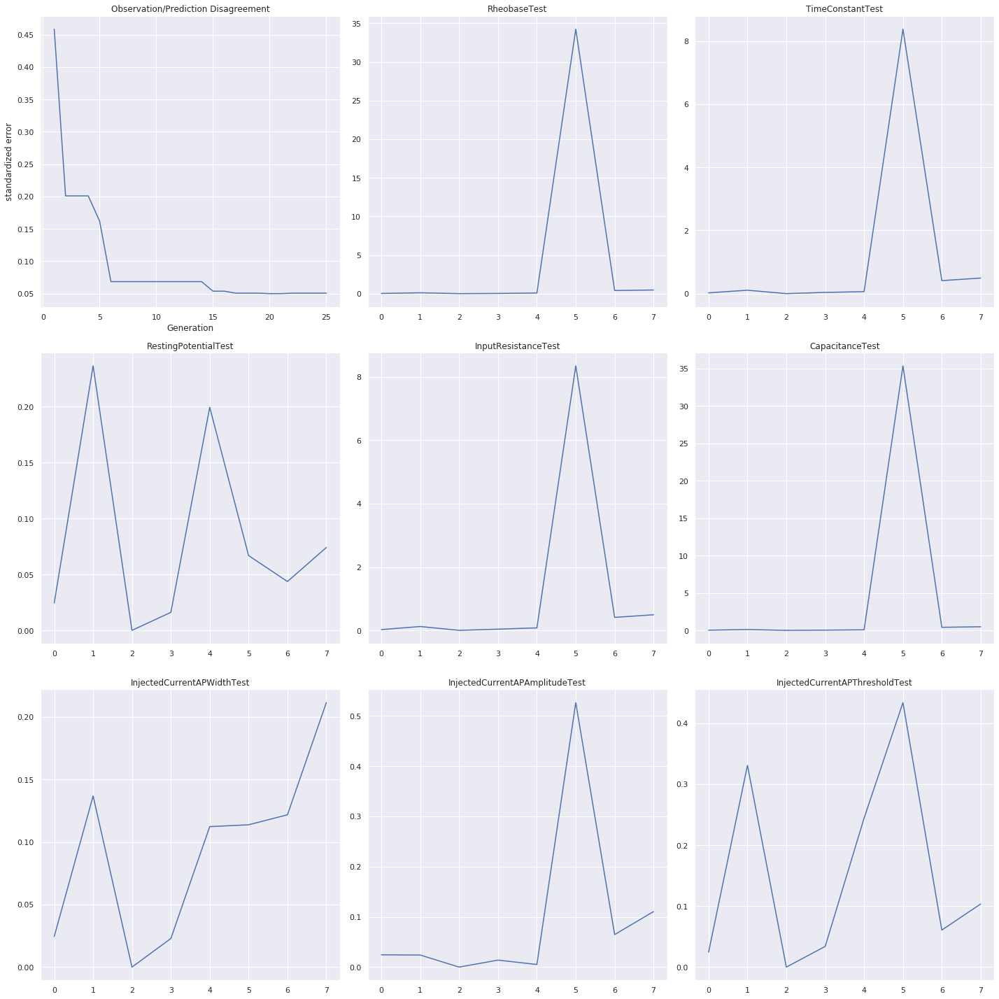

In [27]:
import math
import seaborn as sns
sns.set(style="darkgrid")

fig,axes = plt.subplots(3,3,figsize=(20,20))#math.ceil(len(objectives)/2+1),figsize=(20,20))
axes[0,0].plot(gen_numbers, min_fitness, label='min fitness')

axes[0,0].set_title('Observation/Prediction Disagreement')
for i,c in enumerate(df2.columns):
    ax = axes.flat[i+1]
    history = df2[c]
    #mn = mean[k.name] 
    #st = std[k.name] 
    #history = [(j[i]-mn)/st for j in scores ]
    #ax.axhline(y=mn , xmin=0.02, xmax=0.99,color='red',label='best candidate sampled')

    #ax.axvline(x=min_x , ymin=0.02, ymax=0.99,color='blue',label='best candidate sampled')
    ax.plot(history)
    ax.set_title(str(c))
    #bigger = np.max([np.max(history),mn])
    #smaller = np.max([np.min(history),mn])

    #ax.set_ylim([np.min(history),np.max(history)])
    #ax.set_ylabel(str(front[0].dtc.tests[i].observation['std'].units))
axes[0,0].set_xlabel("Generation")
axes[0,0].set_ylabel("standardized error")

plt.tight_layout()
#if figname is not None:
#    plt.savefig(figname)
#else:
plt.show()

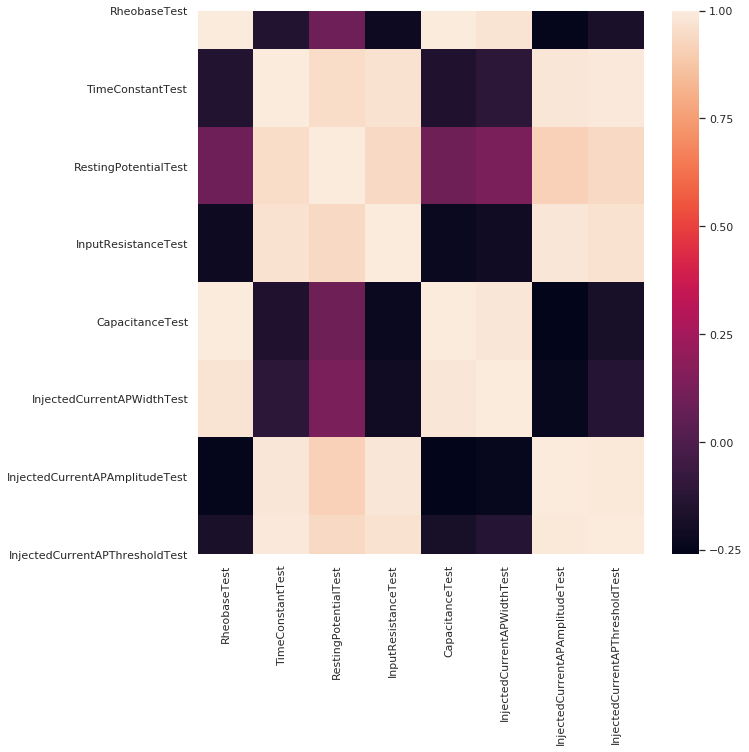

In [25]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)


corr = df1.corr()
fig =plt.figure(figsize=(10,10))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)#, annot=True)
plt.show()